
<br>
<font>
<div dir=ltr align=center>
<font color=0F5298 size=7>
    Machine Learning <br> <br>
<font color=2565AE size=5>
    CE Department <br>
    Fall 2024 - Prof. Sharifi Zarchi<br>
<font color=3C99D size=5>
    HW4 Practical <br>
    Image Colorization<br>
    Image Segmentation<br>
<font color=696880 size=4>
    Shayan Shabani


In [2]:
path = '/kaggle/input/bird-images/archive'

This assignment is structured to introduce students to practical applications of generative models in computer vision.
It targets two challenging areas: colorization and segmentation, using architectures that are complex but very applicable in industry settings.
## Machine Learning Assignment #4: Practical Applications in Image Processing

## Learning Objectives:
By the end of this assignment, students will be able to:
1. Understand and implement Variational Autoencoders for image colorization.
2. Apply the U-Net architecture for image segmentation.
3. Preprocess image datasets, including augmentation techniques.
4. Analyze the performance of machine learning models using relevant metrics.
5. Explore the relationship between latent space and output quality in generative models.


# Image Colorization using VAE
In this section of the assignment, students will explore the fascinating field of image colorization using Variational Autoencoders (VAEs), a type of generative model in deep learning. The task involves transforming grayscale images into colored ones, leveraging the encoder-decoder architecture of VAEs, which are adept at learning complex data distributions. Students will implement and fine-tune an autoencoder network, utilizing components like perceptual loss and feature extraction from pre-trained models, to improve colorization output. By doing so, they will gain a deeper understanding of generative models and their practical applications in computer vision tasks. This exercise offers a hands-on opportunity to blend theoretical knowledge with practical coding skills, characterizing the creative potential of AI in image processing.

Dataset: https://drive.google.com/drive/folders/1KeJbfUykGnPlz0q08_b1IjtW8OxkPdQ9?usp=sharing

## Importing Libraries

In [3]:
!pip install pytorch_lightning
!pip install seaborn


In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
import seaborn as sns
from tqdm.notebook import tqdm
import os
import torch
import torch.nn as nn
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn.functional as F
import torchmetrics
from torchmetrics import Metric
import torchvision
import math
import torchvision.models as models
print(plt.style.available)
plt.style.use('seaborn-v0_8')
device = 'cuda' if torch.cuda.is_available() else 'cpu'

np.__version__, device

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


('1.26.4', 'cuda')

## Loading the Data

In [6]:
import os
import pandas as pd
from tqdm import tqdm
from sklearn.utils import shuffle

def load_data(PATH):
    # TODO: Initialize lists to store filenames and their corresponding outcomes
    filenames = []
    labels = []
    # TODO: Create a DataFrame from the filenames and outcomes
    for label in tqdm(os.listdir(PATH), desc=f"Loading data from {PATH}"):
        label_path = os.path.join(PATH, label)
    # TODO: Return the shuffled DataFrame
        if os.path.isdir(label_path):
            for img_file in os.listdir(label_path):
                img_path = os.path.join(label_path, img_file)
                filenames.append(img_path)
                labels.append(label)
    data = pd.DataFrame({
        'filename': filenames,
        'label': labels
    })
    # TODO: Return the shuffled DataFrame
    data = shuffle(data).reset_index(drop=True)

    return data
# TODO: Load the training, validation, and test data using the load_data function
train_data = load_data("/kaggle/input/bird-images/archive/train")
val_data = load_data("/kaggle/input/bird-images/archive/valid")
test_data = load_data("/kaggle/input/bird-images/archive/test")
# TODO: Check the shape of the loaded DataFrames to verify correct data loading
print("\nTrain data shape:", train_data.shape)
print("Validation data shape:", val_data.shape)
print("Test data shape:", test_data.shape)

Loading data from /kaggle/input/bird-images/archive/train: 100%|██████████| 20/20 [00:00<00:00, 1171.94it/s]
Loading data from /kaggle/input/bird-images/archive/valid: 100%|██████████| 20/20 [00:00<00:00, 1899.04it/s]
Loading data from /kaggle/input/bird-images/archive/test: 100%|██████████| 20/20 [00:00<00:00, 1827.30it/s]


Train data shape: (3208, 2)
Validation data shape: (100, 2)
Test data shape: (100, 2)


In [7]:
# TODO: Combine the training and test data into a single DataFrame along the vertical axis
combined_data = pd.concat([train_data, test_data], axis=0).reset_index(drop=True)
print("Combined data shape:", combined_data.shape)

Combined data shape: (3308, 2)


In [8]:
# TODO: Explore the new DataFrame
# Display the first few rows of the combined DataFrame
print("First 5 rows of the DataFrame:")
print(combined_data.head())

# Display basic information about the DataFrame
print("\nBasic info about the DataFrame:")
print(combined_data.info())

# Check for missing values
print("\nChecking for missing values:")
print(combined_data.isnull().sum())

# Display the distribution of labels
print("\nLabel distribution:")
print(combined_data['label'].value_counts())

# Check the size of the DataFrame
print("\nDataFrame shape (rows, columns):")
print(combined_data.shape)

# Preview random samples to verify the randomness of the DataFrame
print("\nRandom sample rows:")
print(combined_data.sample(5))


First 5 rows of the DataFrame:
                                            filename                  label
0  /kaggle/input/bird-images/archive/train/ALBERT...         ALBERTS TOWHEE
1  /kaggle/input/bird-images/archive/train/ABBOTT...          ABBOTTS BOOBY
2  /kaggle/input/bird-images/archive/train/ABBOTT...          ABBOTTS BOOBY
3  /kaggle/input/bird-images/archive/train/AFRICA...  AFRICAN PIED HORNBILL
4  /kaggle/input/bird-images/archive/train/ALBERT...         ALBERTS TOWHEE

Basic info about the DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3308 entries, 0 to 3307
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  3308 non-null   object
 1   label     3308 non-null   object
dtypes: object(2)
memory usage: 51.8+ KB
None

Checking for missing values:
filename    0
label       0
dtype: int64

Label distribution:
label
AFRICAN PIED HORNBILL         192
ABBOTTS BOOBY                 185
AMERICAN A

## Plot some of the images

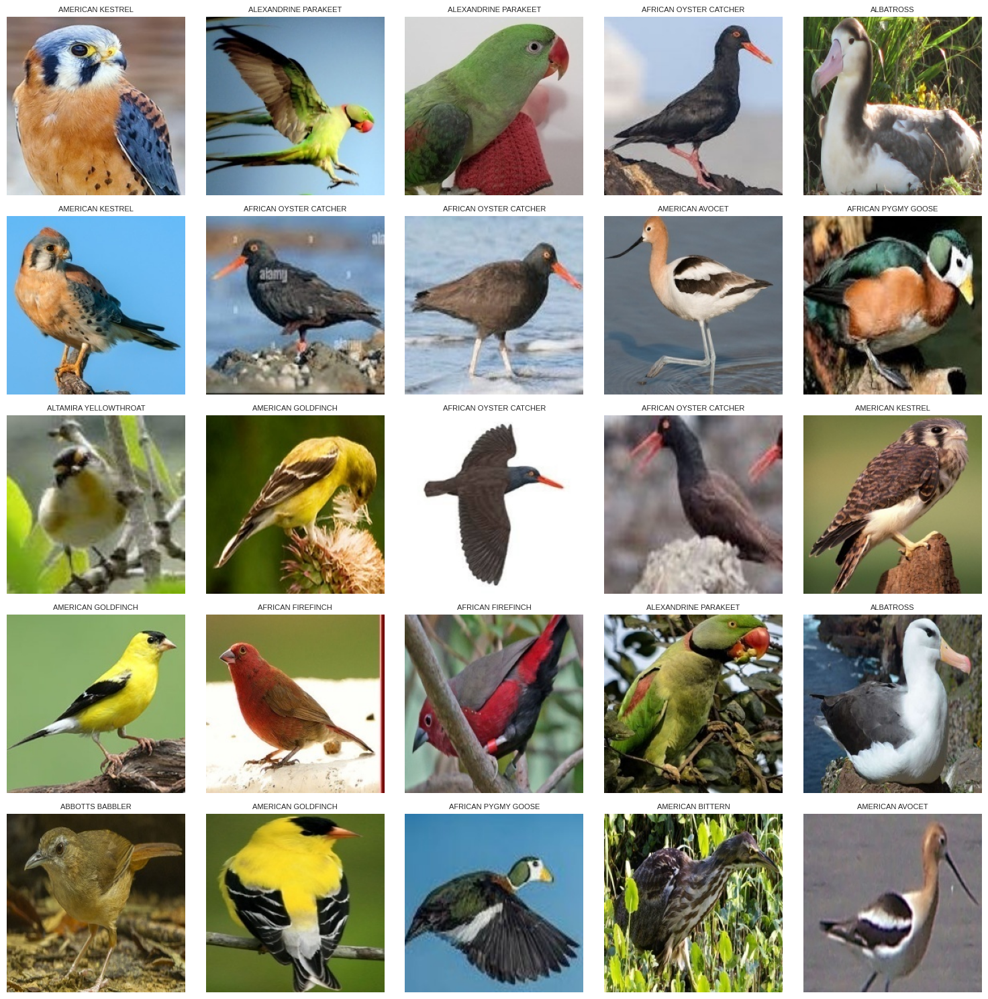

In [ ]:
# TODO: Plot some of images
import random
# Function to plot images in a grid
def plot_images(data, n_rows=5, n_cols=5):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 15))
    axes = axes.flatten()

    for i, ax in enumerate(axes):
        random_idx = random.randint(0, len(data) - 1)
        img_path = data['filename'].iloc[random_idx]
        label = data['label'].iloc[random_idx]

        # Load and display the image
        img = mpimg.imread(img_path)
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(label, fontsize=8)

    plt.tight_layout()
    plt.show()

# Plot images from the combined dataset
plot_images(combined_data, n_rows=5, n_cols=5)


## Dataset Distribution
plot the distribution of the dataset, both training and validation set

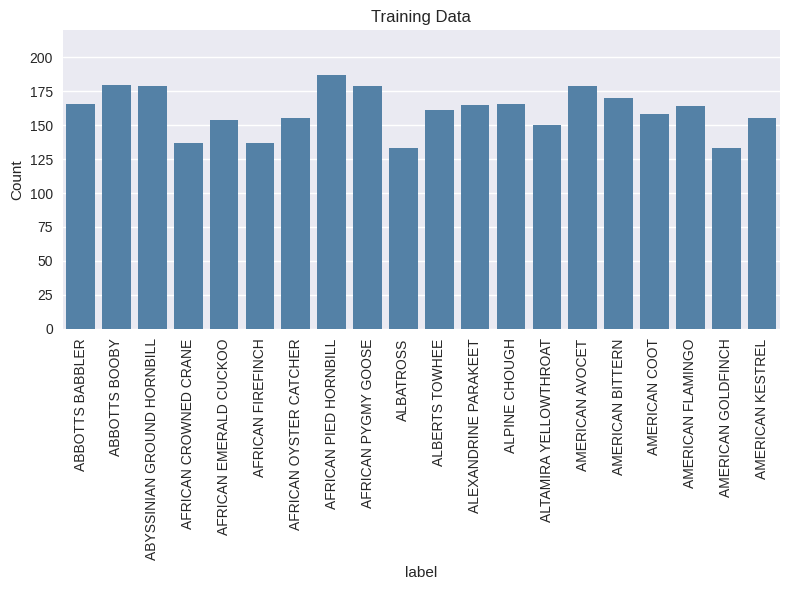

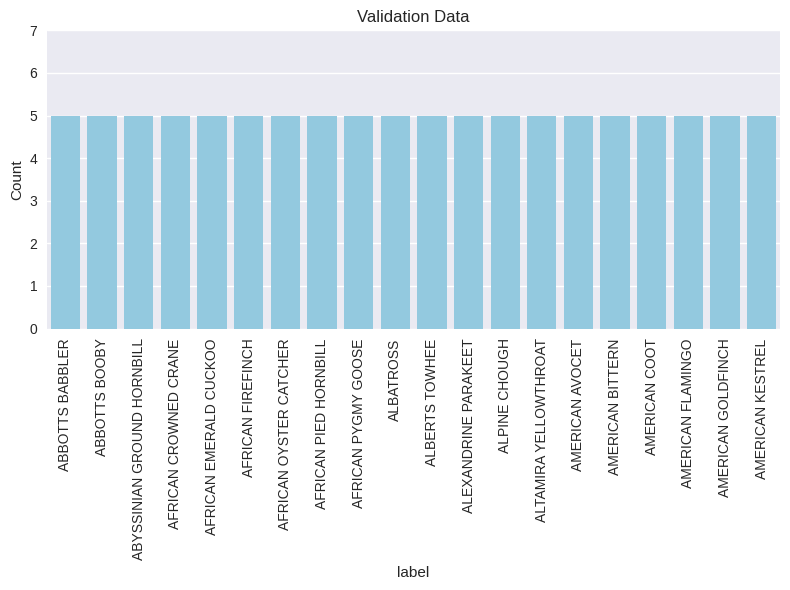

In [9]:
# TODO: Plot the distribution of classes
train_class_counts = train_data['label'].value_counts().sort_index()
train_class_distribution = train_class_counts.reset_index()
train_class_distribution.columns = ['label', 'count']

valid_class_counts = val_data['label'].value_counts().sort_index()
valid_class_distribution = valid_class_counts.reset_index()
valid_class_distribution.columns = ['label', 'count']

plt.figure(figsize=(8, 6))
sns.barplot(data=train_class_distribution, x='label', y='count', color='steelblue')
plt.title('Training Data')
plt.ylabel('Count')
plt.xticks(rotation=90)  # Rotate x-axis labels
plt.ylim(0, 220)  # Set y-axis limit
plt.tight_layout()
plt.show()


plt.figure(figsize=(8, 6))
sns.barplot(data=valid_class_distribution, x='label', y='count', color='skyblue')
plt.title('Validation Data')
plt.ylabel('Count')
plt.xticks(rotation=90)  # Rotate x-axis labels
plt.ylim(0, 7)  # Set y-axis limit
plt.tight_layout()
plt.show()


## Dataset Preparation
Now we are going to build the dataset by using `Dataset` and `DataLoader` classes within PyTorch. I recommend you to randomly crop the images to (160, 160) and then normalize them.

In [10]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import pandas as pd

class BirdDataset(Dataset):
    def __init__(self, df, transform=None):
        """
        Initializes the dataset with a DataFrame and transformations.
        Args:
            df (pd.DataFrame): DataFrame containing filenames and labels (optional).
            transform (callable, optional): Transforms to be applied to both grayscale and color images.
        """
        self.data = df
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        """
        Retrieves the grayscale and RGB images at the given index.
        Args:
            idx (int): Index of the sample to retrieve.
        Returns:
            tuple: Grayscale image tensor and color image tensor.
        """
        img_path = self.data.iloc[idx]['filename']

        # Load the image as RGB
        color_image = Image.open(img_path).convert("RGB")

        # Convert to grayscale
        grayscale_image = color_image.convert("L")

        # Apply transformations
        if self.transform:
            color_image = self.transform(color_image)
            grayscale_image = self.transform(grayscale_image)

        return grayscale_image, color_image

# Define preprocessing transformations
transform = transforms.Compose([
    transforms.Resize((160, 160)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])  # For grayscale images
])


# Initialize datasets
train_dataset = BirdDataset(train_data, transform=transform)
val_dataset = BirdDataset(val_data, transform=transform)
test_dataset = BirdDataset(test_data, transform=transform)

# Initialize data loaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=2)

# Verify one batch
for gray, color in train_loader:
    print(f"Grayscale image tensor shape: {gray.shape}")
    print(f"Color image tensor shape: {color.shape}")
    break


Grayscale image tensor shape: torch.Size([32, 1, 160, 160])
Color image tensor shape: torch.Size([32, 3, 160, 160])


**Why is data augmentation pivotal in training models for image tasks, and what techniques are beneficial for this particular assignment?**

*Data augmentation is crucial in training models for image tasks because it artificially increases the diversity of the training dataset, helping the model generalize better and reducing overfitting. By applying transformations like random cropping, flipping, rotation, color jitter, and normalization, we simulate real-world variations in images, such as lighting changes, orientations, and scale differences. For this bird classification task, techniques like random cropping (to focus on different parts of the bird), color jitter (to mimic lighting variations), and flipping (to account for different bird poses) are particularly beneficial in enhancing the model's robustness to unseen data.*

## Model Architecture
The model has an encoder block for encoding the grayscale image into a lower representation followed by a decoder block to generate the colorized image.

In [20]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import models, transforms
from tqdm import tqdm

# Perceptual Loss using VGG16 pretrained model
class PerceptualLoss(nn.Module):
    def __init__(self, feature_layers=None):
        super(PerceptualLoss, self).__init__()
        self.vgg = models.vgg16(weights=models.VGG16_Weights.DEFAULT).features[:16].eval()
        for param in self.vgg.parameters():
            param.requires_grad = False
        self.feature_layers = feature_layers if feature_layers else [3, 8, 15]
        self.normalizer = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                       std=[0.229, 0.224, 0.225])

    def forward(self, pred, target):
        loss = 0
        pred, target = self.normalizer(pred), self.normalizer(target)
        for i, layer in enumerate(self.vgg):
            pred, target = layer(pred), layer(target)
            if i in self.feature_layers:
                loss += F.l1_loss(pred, target)
        return loss

# Encoder
class Encoder(nn.Module):
    def __init__(self, use_bn=False):
        super(Encoder, self).__init__()
        self.block1 = self._conv_block(1, 64, use_bn)
        self.block2 = self._conv_block(64, 128, use_bn)
        self.block3 = self._conv_block(128, 256, use_bn)
        self.block4 = self._conv_block(256, 512, use_bn)

    def _conv_block(self, in_c, out_c, use_bn):
        layers = [nn.Conv2d(in_c, out_c, kernel_size=3, padding=1),
                  nn.ReLU(inplace=True),
                  nn.MaxPool2d(2)]
        if use_bn:
            layers.insert(1, nn.BatchNorm2d(out_c))
        return nn.Sequential(*layers)

    def forward(self, x):
        res1 = self.block1(x)
        res2 = self.block2(res1)
        res3 = self.block3(res2)
        res4 = self.block4(res3)
        return [res1, res2, res3, res4]

# Decoder with Skip Connections
class Decoder(nn.Module):
    def __init__(self, use_bn=False):
        super(Decoder, self).__init__()
        self.block1 = self.inner_block(512, 256, use_bn)
        self.block2 = self.inner_block(256, 128, use_bn)
        self.block3 = self.inner_block(128, 64, use_bn)
        self.block4 = self.inner_block(64, 32, use_bn, output=True)
        self.block5 = self.conv_block(32, 3)

    def inner_block(self, in_c, out_c, use_bn, output=False):
        layers = [nn.ConvTranspose2d(in_c, out_c, kernel_size=3, stride=2, padding=1, output_padding=1)]
        if not output:
            if use_bn:
                layers.append(nn.BatchNorm2d(out_c))
            layers.append(nn.ReLU(inplace=True))
        return nn.Sequential(*layers)

    def conv_block(self, in_c, out_c):
        return nn.Conv2d(in_c, out_c, kernel_size=3, stride=1, padding=1)

    def forward(self, features):
        res1, res2, res3, res4 = features
        h = self.block1(res4) + res3
        h = self.block2(h) + res2
        h = self.block3(h) + res1
        h = self.block4(h)
        h = self.block5(h)  # Apply block5 here
        return h

# Main Network
class Net(nn.Module):
    def __init__(self, use_bn=False):
        super(Net, self).__init__()
        self.encoder = Encoder(use_bn)
        self.decoder = Decoder(use_bn)
        self.perceptual_loss = PerceptualLoss()

    def forward(self, x):
        features = self.encoder(x)
        return self.decoder(features)

    def compute_loss(self, pred, target):
        perceptual_loss = self.perceptual_loss(pred, target)
        reconstruction_loss = F.l1_loss(pred, target)
        return 0.1*perceptual_loss + reconstruction_loss
        #return reconstruction_loss
    def train_step(self, loader, optimizer):
        self.train()
        total_loss = 0
        for gray, color in tqdm(loader, desc="Training"):
            gray, color = gray.cuda(), color.cuda()
            optimizer.zero_grad()
            pred = self.forward(gray)
            loss = self.compute_loss(pred, color)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        return total_loss / len(loader)

    def validate_step(self, loader):
        self.eval()
        total_loss = 0
        with torch.no_grad():
            for gray, color in tqdm(loader, desc="Validation"):
                gray, color = gray.cuda(), color.cuda()
                pred = self.forward(gray)
                loss = self.compute_loss(pred, color)
                total_loss += loss.item()
        return total_loss / len(loader)

    def train_model(self, train_loader, val_loader, epochs=10, lr=1e-4):
        optimizer = optim.Adam(self.parameters(), lr=lr)
        train_losses, val_losses = [], []
        for epoch in range(epochs):
            train_loss = self.train_step(train_loader, optimizer)
            val_loss = self.validate_step(val_loader)
            train_losses.append(train_loss)
            val_losses.append(val_loss)
            print(f"Epoch {epoch+1}/{epochs} | Train Loss: {train_loss:.4f} | Validation Loss: {val_loss:.4f}")
        return train_losses, val_losses


In [21]:
# TODO: print the model
model = Net()
print(model)


Net(
  (encoder): Encoder(
    (block1): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (block2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (block3): Sequential(
      (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (block4): Sequential(
      (0): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
  )
  (decoder): Decoder(
    (block1): Sequential(
      (0): ConvTr

## Training Phase

In [23]:
# TODO: Train
# Students should implement the training loop. During training, monitor both training and validation metrics
# to ensure the model learns effectively without overfitting.
model = Net().cuda()
train_losses, val_losses = model.train_model(epochs = 50, train_loader=train_loader, val_loader=val_loader, lr = 0.001)

Validation: 100%|██████████| 4/4 [00:00<00:00,  5.59it/s]


Epoch 1/50 | Train Loss: 0.6145 | Validation Loss: 0.5391


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.33it/s]


Epoch 2/50 | Train Loss: 0.5103 | Validation Loss: 0.5286


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.96it/s]


Epoch 3/50 | Train Loss: 0.4923 | Validation Loss: 0.5099


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.53it/s]


Epoch 4/50 | Train Loss: 0.4884 | Validation Loss: 0.5142


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.87it/s]


Epoch 5/50 | Train Loss: 0.4808 | Validation Loss: 0.4742


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.97it/s]


Epoch 6/50 | Train Loss: 0.4776 | Validation Loss: 0.5097


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.86it/s]


Epoch 7/50 | Train Loss: 0.4796 | Validation Loss: 0.4980


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.94it/s]


Epoch 8/50 | Train Loss: 0.4753 | Validation Loss: 0.4921


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.39it/s]


Epoch 9/50 | Train Loss: 0.4699 | Validation Loss: 0.5039


Validation: 100%|██████████| 4/4 [00:00<00:00,  6.07it/s]


Epoch 10/50 | Train Loss: 0.4749 | Validation Loss: 0.4895


Validation: 100%|██████████| 4/4 [00:00<00:00,  6.11it/s]


Epoch 11/50 | Train Loss: 0.4702 | Validation Loss: 0.4530


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.88it/s]


Epoch 12/50 | Train Loss: 0.4700 | Validation Loss: 0.4914


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.69it/s]


Epoch 13/50 | Train Loss: 0.4681 | Validation Loss: 0.4674


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.83it/s]


Epoch 14/50 | Train Loss: 0.4690 | Validation Loss: 0.4579


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.93it/s]


Epoch 15/50 | Train Loss: 0.4688 | Validation Loss: 0.4555


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.92it/s]


Epoch 16/50 | Train Loss: 0.4695 | Validation Loss: 0.4681


Validation: 100%|██████████| 4/4 [00:00<00:00,  6.25it/s]


Epoch 17/50 | Train Loss: 0.4650 | Validation Loss: 0.4639


Validation: 100%|██████████| 4/4 [00:00<00:00,  6.04it/s]


Epoch 18/50 | Train Loss: 0.4670 | Validation Loss: 0.4691


Validation: 100%|██████████| 4/4 [00:00<00:00,  6.17it/s]


Epoch 19/50 | Train Loss: 0.4667 | Validation Loss: 0.4928


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.78it/s]


Epoch 20/50 | Train Loss: 0.4626 | Validation Loss: 0.4969


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.99it/s]


Epoch 21/50 | Train Loss: 0.4635 | Validation Loss: 0.4681


Validation: 100%|██████████| 4/4 [00:00<00:00,  6.12it/s]


Epoch 22/50 | Train Loss: 0.4639 | Validation Loss: 0.4696


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.83it/s]


Epoch 23/50 | Train Loss: 0.4580 | Validation Loss: 0.4857


Validation: 100%|██████████| 4/4 [00:00<00:00,  6.02it/s]


Epoch 24/50 | Train Loss: 0.4597 | Validation Loss: 0.4900


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.84it/s]


Epoch 25/50 | Train Loss: 0.4584 | Validation Loss: 0.4918


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.67it/s]


Epoch 26/50 | Train Loss: 0.4565 | Validation Loss: 0.5007


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.88it/s]


Epoch 27/50 | Train Loss: 0.4600 | Validation Loss: 0.4669


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.85it/s]


Epoch 28/50 | Train Loss: 0.4573 | Validation Loss: 0.4698


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.65it/s]


Epoch 29/50 | Train Loss: 0.4567 | Validation Loss: 0.4594


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.87it/s]


Epoch 30/50 | Train Loss: 0.4541 | Validation Loss: 0.4719


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.98it/s]


Epoch 31/50 | Train Loss: 0.4561 | Validation Loss: 0.4475


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.67it/s]


Epoch 32/50 | Train Loss: 0.4536 | Validation Loss: 0.4667


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.83it/s]


Epoch 33/50 | Train Loss: 0.4592 | Validation Loss: 0.4695


Validation: 100%|██████████| 4/4 [00:00<00:00,  6.03it/s]


Epoch 34/50 | Train Loss: 0.4534 | Validation Loss: 0.4742


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.58it/s]


Epoch 35/50 | Train Loss: 0.4546 | Validation Loss: 0.4712


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.69it/s]


Epoch 36/50 | Train Loss: 0.4522 | Validation Loss: 0.4830


Validation: 100%|██████████| 4/4 [00:00<00:00,  6.12it/s]


Epoch 37/50 | Train Loss: 0.4532 | Validation Loss: 0.4690


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.22it/s]


Epoch 38/50 | Train Loss: 0.4499 | Validation Loss: 0.4781


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.52it/s]


Epoch 39/50 | Train Loss: 0.4489 | Validation Loss: 0.4740


Validation: 100%|██████████| 4/4 [00:00<00:00,  6.06it/s]


Epoch 40/50 | Train Loss: 0.4542 | Validation Loss: 0.4575


Validation: 100%|██████████| 4/4 [00:00<00:00,  6.14it/s]


Epoch 41/50 | Train Loss: 0.4525 | Validation Loss: 0.4803


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.46it/s]


Epoch 42/50 | Train Loss: 0.4504 | Validation Loss: 0.4876


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.87it/s]


Epoch 43/50 | Train Loss: 0.4503 | Validation Loss: 0.4553


Validation: 100%|██████████| 4/4 [00:00<00:00,  6.12it/s]


Epoch 44/50 | Train Loss: 0.4496 | Validation Loss: 0.4492


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.79it/s]


Epoch 45/50 | Train Loss: 0.4485 | Validation Loss: 0.4741


Validation: 100%|██████████| 4/4 [00:00<00:00,  6.12it/s]


Epoch 46/50 | Train Loss: 0.4522 | Validation Loss: 0.4663


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.75it/s]


Epoch 47/50 | Train Loss: 0.4491 | Validation Loss: 0.4418


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.78it/s]


Epoch 48/50 | Train Loss: 0.4424 | Validation Loss: 0.4780


Validation: 100%|██████████| 4/4 [00:00<00:00,  5.89it/s]


Epoch 49/50 | Train Loss: 0.4469 | Validation Loss: 0.4570


Validation: 100%|██████████| 4/4 [00:00<00:00,  6.09it/s]

Epoch 50/50 | Train Loss: 0.4446 | Validation Loss: 0.4847


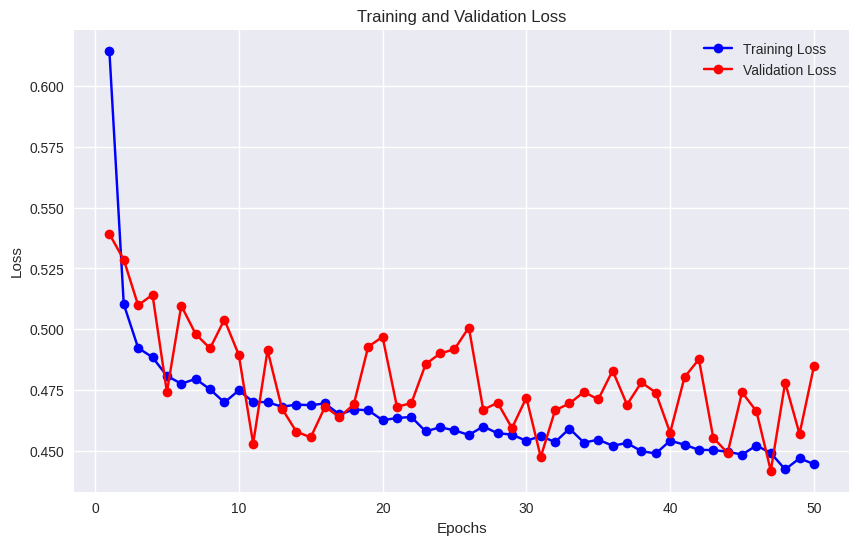

In [24]:
# TODO: Plot training and validation loss over epochs
def plot_losses(train_losses, val_losses):
    """
    Plots the training and validation losses over epochs.
    Args:
        train_losses (list): Training loss values for each epoch.
        val_losses (list): Validation loss values for each epoch.
    """
    epochs = range(1, len(train_losses) + 1)

    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_losses, 'bo-', label='Training Loss')  # Blue line with circle markers
    plt.plot(epochs, val_losses, 'ro-', label='Validation Loss')  # Red line with circle markers
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()
plot_losses(train_losses,val_losses)

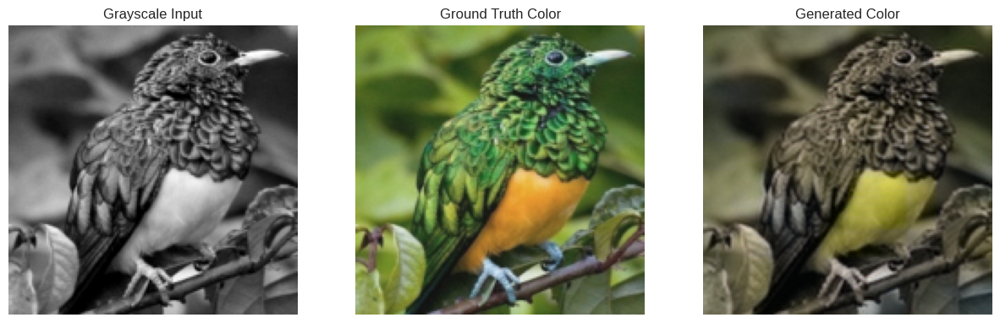

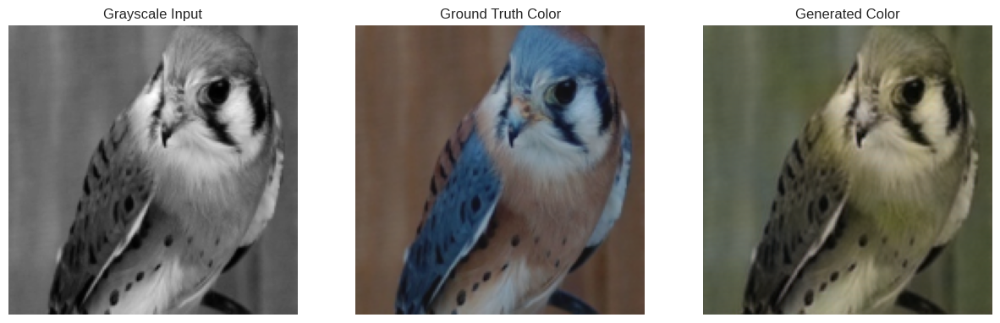

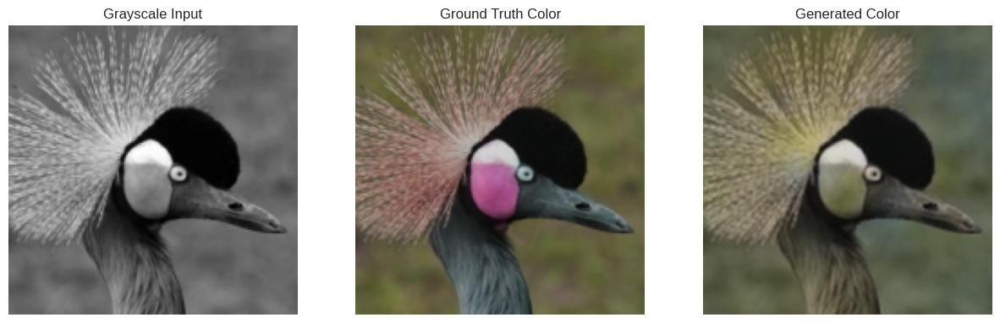

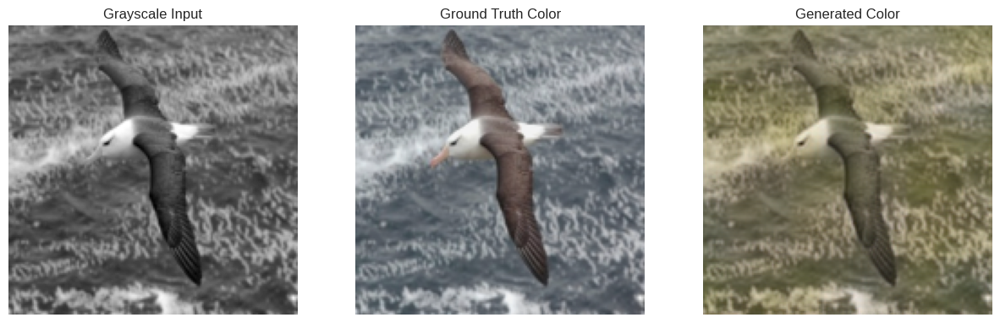

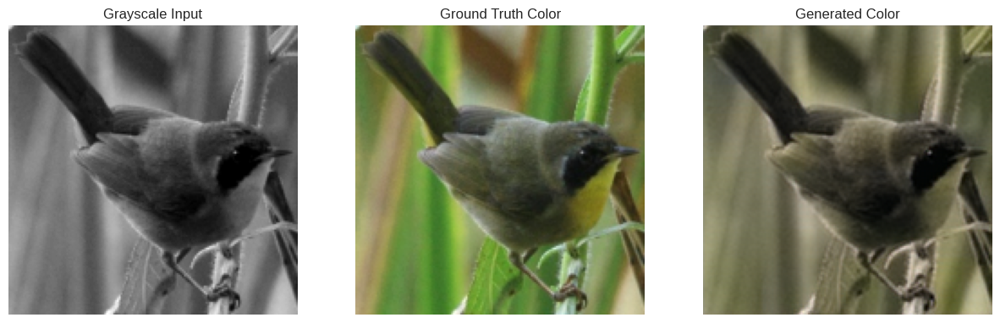

In [39]:
import matplotlib.pyplot as plt

def visualize_predictions(model, data_loader):
    model.eval()
    count = 0  # Counter for the number of images displayed
    for gray, color in data_loader:
        gray, color = gray.cuda(), color.cuda()
        pred = model(gray)

        for i in range(len(gray)):
            if count >= 5:  # Stop after visualizing 5 images
                break

            fig, axes = plt.subplots(1, 3, figsize=(15, 5))

            axes[0].imshow(gray[i].squeeze().cpu().numpy(), cmap='gray')
            axes[0].set_title('Grayscale Input')
            axes[0].axis('off')  # Disable grid
            axes[1].imshow(color[i].permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)
            axes[1].set_title('Ground Truth Color')
            axes[1].axis('off')  # Disable grid
            axes[2].imshow(pred[i].permute(1, 2, 0).cpu().detach().numpy() * 0.5 + 0.5)  # Rescale [-1, 1] to [0, 1]
            axes[2].set_title('Generated Color')
            axes[2].axis('off')  # Disable grid



            plt.show()
            count += 1

        if count >= 5:
            break

visualize_predictions(model, val_loader)


<ipython-input-41-008f9a096762>:31: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(latent_2d[:, 0], latent_2d[:, 1], s=5, cmap='viridis', alpha=0.7)


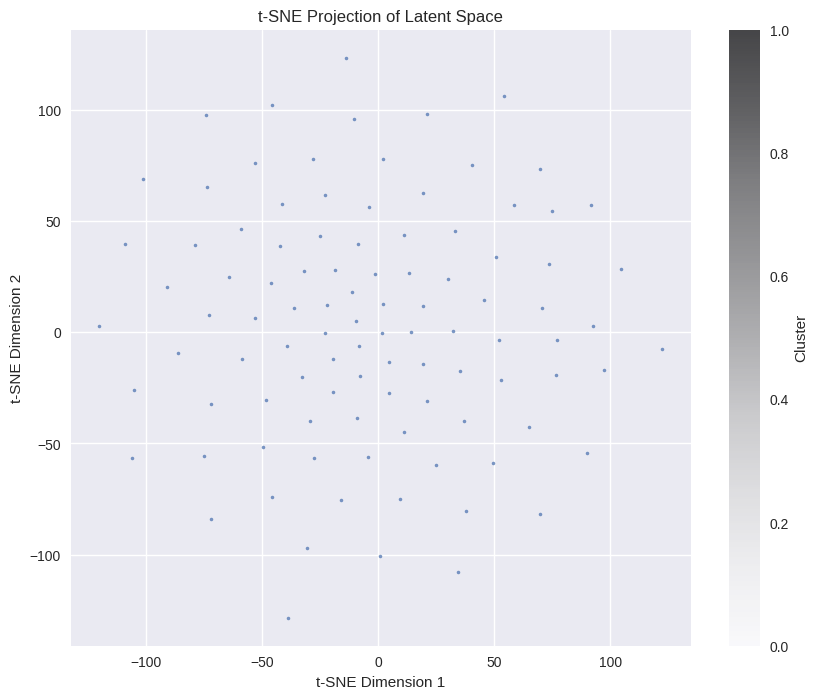

In [41]:
def visualize_latent_space(encoder, data_loader, num_samples=1000):
    """
    Visualize the latent space of the VAE using t-SNE.

    Parameters:
        encoder (torch.nn.Module): Trained encoder model.
        data_loader (torch.utils.data.DataLoader): Data loader for input data.
        num_samples (int): Number of samples to visualize.
    """
    encoder.eval()  # Set the encoder to evaluation mode
    device = next(encoder.parameters()).device  # Identify device (CPU or GPU)
    
    # Collect latent representations
    latent_vectors = []
    with torch.no_grad():
        for i, (gray, _) in enumerate(data_loader):
            if len(latent_vectors) >= num_samples:
                break
            gray = gray.to(device)
            mu = encoder(gray)[-1].flatten(start_dim=1)  # Get latent mean
            latent_vectors.append(mu)
    
    latent_vectors = torch.cat(latent_vectors, dim=0).cpu().numpy()
    
    # Apply t-SNE
    tsne = TSNE(n_components=2, random_state=42, perplexity=30, learning_rate=200)
    latent_2d = tsne.fit_transform(latent_vectors)
    
    # Plot 2D projection
    plt.figure(figsize=(10, 8))
    plt.scatter(latent_2d[:, 0], latent_2d[:, 1], s=5, cmap='viridis', alpha=0.7)
    plt.title("t-SNE Projection of Latent Space")
    plt.xlabel("t-SNE Dimension 1")
    plt.ylabel("t-SNE Dimension 2")
    plt.colorbar(label="Cluster")
    plt.show()
visualize_latent_space(model.encoder, test_loader, num_samples=1000)

How the distribution of points in the latent space reflects the VAE's capability to generalize grayscale images into colored outputs.

1. **Clustering and Class Representation**:
    - Can you identify clusters in the latent space that correspond to specific image features or categories?
    - How do these clusters inform us about the VAE's ability to differentiate between various input characteristics related to color information?
   
**Answer:** *The distribution of points in the plot does not show strong clustering patterns. This may suggest that the VAE's latent space representation does not strongly separate features or categories of grayscale images that correspond to different color information. Instead, the points are relatively evenly distributed, indicating a more diffuse encoding.  If distinct clusters corresponding to specific features (e.g., regions with similar shading or texture) were visible, it would indicate that the VAE has learned to separate these features effectively. The lack of clear clustering might imply that the latent space encodes a more generalized, overlapping representation, which could limit the model's precision in capturing specific image characteristics.*

2. **Continuity and Transitions**:
    - Analyze whether neighboring points in the latent space result in similar or different color outputs. What does this continuity suggest about the latent representation's smoothness?
    - How could these visual transitions impact the quality and realism of the generated colorations, especially for input images that exhibit gradual changes (e.g., transitions in lighting or shading)?

**Answer:** *In the absence of clear cluster boundaries, it becomes essential to analyze whether neighboring points in this space represent similar color outputs. Ideally, smooth transitions between neighboring points should correspond to smooth color gradients or shading in the output, indicating a well-structured latent space. Smooth and continuous latent spaces generally lead to high-quality and realistic outputs, as they prevent abrupt changes in the colorization process. If the latent space lacks this continuity, the VAE might produce unnatural transitions in color, particularly for grayscale images with gradual changes in intensity.*

3. **Effectiveness of Dimensionality Reduction**:
    - Assess the effectiveness of t-SNE in projecting high-dimensional latent vectors into a comprehensible 2D representation. What limitations might exist, and how do they affect your interpretation?
**Answer:** *t-SNE effectively provides a comprehensible 2D representation of high-dimensional latent vectors by preserving local neighborhoods. This means points that are close in the original latent space should remain close in the 2D projection. t-SNE is not great at preserving global structures; distant points in the high-dimensional space may appear arbitrarily close or far apart in the 2D plot. This limitation means that while we can interpret local clusters and relationships, the global layout might not fully reflect the true latent structure, potentially leading to misinterpretation of overall separability or smoothness.*

Elaborate on how the encoder-decoder architecture facilitates the learning of complex data distributions in image colorization. How does this architecture differ from a simple autoencoder?

*The encoder-decoder architecture is particularly suited for learning complex data distributions in image colorization because it captures hierarchical features and integrates contextual information through downsampling and upsampling stages. The encoder progressively compresses the input grayscale image into a compact latent representation, preserving essential structures while discarding redundant details. The decoder then reconstructs the colored image, utilizing skip connections to blend high-level features with localized details, ensuring spatial accuracy. Unlike a simple autoencoder, which directly maps input to output without detailed hierarchical encoding, the skip connections in the encoder-decoder architecture allow for finer control and higher-quality reconstructions by bridging gaps between low-level and high-level features, crucial for tasks like colorization where detail and context are both essential.*

Analyze the role of perceptual loss in enhancing the quality of colorized images. How does perceptual loss measure image similarity compared to pixel-wise losses like Mean Squared Error (MSE)?

*Perceptual loss enhances the quality of colorized images by comparing high-level feature representations from a pre-trained network (e.g., VGG16) rather than relying solely on pixel-wise differences. Unlike Mean Squared Error (MSE), which evaluates similarity based on pixel intensity differences and often results in overly smooth images, perceptual loss captures semantic and perceptual differences by focusing on how similar the images appear in terms of structure, texture, and content. This allows the model to produce more realistic and visually pleasing colorizations by preserving details and ensuring that the generated colors align with human perception rather than minimizing numerical differences alone.*

Discuss how the latent space in a VAE impacts the fidelity and diversity of generated color images. What effects could varying the dimensionality of the latent space have?

*The latent space in a VAE plays a crucial role in balancing the fidelity and diversity of generated color images. A well-structured latent space ensures that encoded representations capture meaningful variations in the data, leading to realistic and coherent reconstructions. Higher-dimensional latent spaces provide more capacity to encode complex features, improving image fidelity by preserving intricate details. However, excessively large latent spaces may lead to overfitting, reducing generalization and diversity. Conversely, lower-dimensional latent spaces encourage generalization and diversity by forcing the model to capture only essential features but may result in loss of fine details or unrealistic outputs. Tuning the dimensionality of the latent space is critical for achieving an optimal balance between image quality and variety.*

# Image Segmentation with U-Net
Image segmentation is a crucial task in computer vision aimed at dividing an image into meaningful segments or objects. The U-Net architecture, famed for its utility in medical imaging, excels at this by leveraging its encoder-decoder structure, which efficiently learns and reconstructs image details. In this task, the U-Net is trained on pairs of images and masks, enabling it to delineate object boundaries at the pixel level with high precision. The training process involves preprocessing the data, adjusting network parameters, and evaluating the model using metrics like Intersection over Union (IoU) to ensure effective segmentation. Successful implementation of U-Net for this purpose can revolutionize applications in areas like autonomous vehicles, medical diagnosis, and agricultural monitoring.

Dataset: https://drive.google.com/drive/folders/1g97fGNQ6buixT8Hp96QyEYOMNKby5Oe8?usp=sharing

## Importing necessary libraries

In [17]:
# import system libs
import os
import time
import glob
import shutil

# import data handling tools
import cv2
import PIL
from PIL import Image
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
# import necessary PyTorch libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
import seaborn as sns
from tqdm.notebook import tqdm
import os
import torch
import torch.nn as nn
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn.functional as F
import torchmetrics
from torchmetrics import Metric
import torchvision
import math
import torchvision.models as models
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from tqdm import tqdm
print(plt.style.available)
plt.style.use('seaborn-v0_8')
device = 'cuda' if torch.cuda.is_available() else 'cpu'

np.__version__, device
print ('modules loaded')

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']
modules loaded


## Load the Dataset

Number of images: 290
Number of masks: 290
Image shape: (290, 256, 256, 3)
Mask shape: (290, 256, 256, 1)


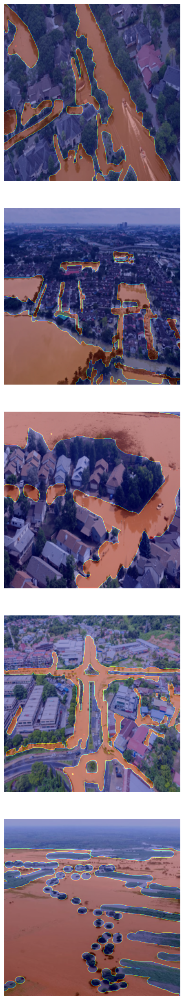

In [20]:
def create_data(data_dir):
    images_dir = os.path.join(data_dir, "Image")
    masks_dir = os.path.join(data_dir, "Mask")

    image_paths = [os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith(".jpg")]
    mask_paths = [os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith(".png")]
    
    image_paths.sort()
    mask_paths.sort()

    return image_paths, mask_paths

def load_image(image_path, SIZE):
    img = Image.open(image_path).convert("RGB")
    img = img.resize((SIZE, SIZE))
    img = np.array(img) / 255.0
    return img

def load_images(image_paths, SIZE, mask=False, trim=None):
    if trim:
        image_paths = image_paths[:trim]
    images = []
    for path in image_paths:
        img = Image.open(path)
        if mask:
            img = img.convert("L")
        else:
            img = img.convert("RGB")
        img = img.resize((SIZE, SIZE))
        img = np.array(img)
        if mask:
            img = img / 255.0
            if len(img.shape) == 2:
                img = np.expand_dims(img, axis=-1)
        else:
          img = img / 255.0

        images.append(img)
    return np.array(images)

def show_image(image, title=None, cmap=None, alpha=1):
    plt.imshow(image, cmap=cmap, alpha=alpha)
    plt.axis('off')
    if title:
        plt.title(title)
    plt.show()

def show_mask(image, mask, cmap='jet', alpha=0.4):
    plt.imshow(image)
    plt.imshow(mask, cmap=cmap, alpha=alpha)
    plt.axis('off')

def show_images(imgs, msks, num_images=5):
    num_to_show = min(num_images, len(imgs))
    indices = random.sample(range(len(imgs)), num_to_show)

    fig, axes = plt.subplots(num_to_show, 1, figsize=(5, 5 * num_to_show))
    fig.tight_layout()

    for i, idx in enumerate(indices):
        axes[i].imshow(imgs[idx])
        axes[i].imshow(msks[idx], cmap='jet', alpha=0.4)
        axes[i].axis('off')

    plt.show()

SIZE = 256
DATA_DIR = "/kaggle/input/masking-shits/seg_archive"

image_paths, mask_paths = create_data(DATA_DIR)

images = load_images(image_paths, SIZE)
masks = load_images(mask_paths, SIZE, mask=True)

print(f"Number of images: {len(images)}")
print(f"Number of masks: {len(masks)}")
print(f"Image shape: {images.shape}")
print(f"Mask shape: {masks.shape}")

show_images(images, masks)

## The Architecture
In addition to U-Net, we are going to utilize Attention Gates.
You probably need to read this paper: https://arxiv.org/pdf/1804.03999v3

In [39]:
class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        """
        Compute the Dice coefficient loss.
        - pred: predicted segmentation probabilities
        - target: ground truth masks
        """
        if pred.shape != target.shape:
            pred = F.interpolate(pred, size=target.shape[2:], mode='bilinear', align_corners=False)

        intersection = (pred * target).sum()
        union = pred.sum() + target.sum()
        dice = (2.0 * intersection + self.smooth) / (union + self.smooth)
        return 1 - dice


class JaccardLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(JaccardLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        """
        Compute the Jaccard (IoU) loss.
        - pred: predicted segmentation probabilities
        - target: ground truth masks
        """
        if pred.shape != target.shape:
            pred = F.interpolate(pred, size=target.shape[2:], mode='bilinear', align_corners=False)

        intersection = (pred * target).sum()
        union = pred.sum() + target.sum() - intersection
        jaccard = (intersection + self.smooth) / (union + self.smooth)
        return 1 - jaccard



class EncoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, rate, pooling=True):
        super(EncoderBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(rate)
        self.pooling = nn.MaxPool2d(2) if pooling else None

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.dropout(x)
        if self.pooling:
            x = self.pooling(x)
        return x


class DecoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, rate):
        super(DecoderBlock, self).__init__()
        self.up = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
        self.conv = nn.Sequential(
            nn.Conv2d(out_channels * 2, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
            nn.Dropout(rate),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )

    def forward(self, x, skip_connection):
        x = self.up(x)
        x = torch.cat([x, skip_connection], dim=1)  # Concatenate along the channel dimension
        x = self.conv(x)
        return x


class AttentionGate(nn.Module):
    def __init__(self, filters, bn=True):
        super(AttentionGate, self).__init__()
        self.W_g = nn.Conv2d(filters, filters, kernel_size=1)
        self.W_x = nn.Conv2d(filters, filters, kernel_size=1)
        self.psi = nn.Conv2d(filters, 1, kernel_size=1)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()
        self.bn = nn.BatchNorm2d(filters) if bn else nn.Identity()

    def forward(self, x, g):
        g1 = self.W_g(g)
        x1 = self.W_x(x)
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        psi = self.sigmoid(psi)
        return x * psi


class UNetModel(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UNetModel, self).__init__()
        self.enc1 = EncoderBlock(in_channels, 64, 0.1)
        self.enc2 = EncoderBlock(64, 128, 0.1)
        self.dec1 = DecoderBlock(128, 64, 0.1)
        self.att = AttentionGate(64)

        self.final = nn.Conv2d(64, out_channels, kernel_size=1)

    def forward(self, x):
        enc1 = self.enc1(x)
        enc2 = self.enc2(enc1)
        dec1 = self.dec1(enc2, enc1)
        x = self.att(dec1, enc1)
        x = self.final(x)
        return torch.sigmoid(x)  # Ensures predictions are in the range [0, 1]


    def compute_loss(self, pred, target):
        dice_loss = DiceLoss()(pred, target)
        jaccard_loss = JaccardLoss()(pred, target)
        return dice_loss + jaccard_loss


## Training

In [42]:
from torch.utils.data import random_split
class SegmentationDataset(Dataset):
    def __init__(self, image_paths, mask_paths, size):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.size = size

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = load_image(self.image_paths[idx], self.size)
        mask = load_image(self.mask_paths[idx], self.size)
        mask = np.expand_dims(mask[:,:,0], axis=-1)  # Keep only one channel

        image = torch.from_numpy(image).float().permute(2, 0, 1)
        mask = torch.from_numpy(mask).float().permute(2, 0, 1)

        return image, mask

# Training parameters
BATCH_SIZE = 4
EARLY_STOPPING_PATIENCE = 10
LEARNING_RATE = 1e-4
MODEL_SAVE_PATH = "unet_model.pth"
SIZE = 256
DATA_DIR = "/kaggle/input/masking-shits/seg_archive"
NUM_EPOCHS = 100
# Create dataset

image_paths, mask_paths = create_data(DATA_DIR)
train_dataset = SegmentationDataset(image_paths, mask_paths, SIZE)

val_split_ratio = 0.2
val_size = int(len(train_dataset) * val_split_ratio)
train_size = len(train_dataset) - val_size

train_subset, val_subset = random_split(train_dataset, [train_size, val_size])
train_loader = DataLoader(train_subset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_subset, batch_size=BATCH_SIZE, shuffle=False)
# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize the model, optimizer, and loss function
model = UNetModel(in_channels=3, out_channels=1).to(device)
optimizer = Adam(model.parameters(), lr=LEARNING_RATE)

def train_model(train_loader, val_loader, model, optimizer, num_epochs, model_save_path, early_stopping_patience):
    best_loss = float('inf')
    patience_counter = 0

    # Lists to store metrics
    train_losses, val_losses = [], []
    train_accuracies, val_accuracies = [], []

    for epoch in range(num_epochs):
        # Training phase
        model.train()
        train_loss = 0.0
        correct_train_pixels = 0
        total_train_pixels = 0

        for images, masks in train_loader:
            images, masks = images.to(device), masks.to(device)

            # Forward pass
            predictions = model(images)

            # Resize predictions to match masks
            predictions_resized = F.interpolate(predictions, size=masks.shape[2:], mode='bilinear', align_corners=False)
            
            # Compute loss
            loss = model.compute_loss(predictions_resized, masks)
            
            # Backward pass and optimization
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            train_loss += loss.item()

            # Calculate accuracy
            pred_binary = (predictions_resized > 0.5).float()  # Threshold at 0.5 for binary segmentation
            correct_train_pixels += (pred_binary == masks).sum().item()
            total_train_pixels += masks.numel()

        train_loss /= len(train_loader)
        train_accuracy = correct_train_pixels / total_train_pixels

        # Validation phase
        model.eval()
        val_loss = 0.0
        correct_val_pixels = 0
        total_val_pixels = 0

        with torch.no_grad():
            for images, masks in val_loader:
                images, masks = images.to(device), masks.to(device)

                # Forward pass
                predictions = model(images)

                # Resize predictions to match masks
                predictions_resized = F.interpolate(predictions, size=masks.shape[2:], mode='bilinear', align_corners=False)

                # Compute loss
                loss = model.compute_loss(predictions_resized, masks)
                val_loss += loss.item()

                # Calculate accuracy
                pred_binary = (predictions_resized > 0.5).float()
                correct_val_pixels += (pred_binary == masks).sum().item()
                total_val_pixels += masks.numel()

        val_loss /= len(val_loader)
        val_accuracy = correct_val_pixels / total_val_pixels

        # Save metrics
        train_losses.append(train_loss)
        val_losses.append(val_loss)
        train_accuracies.append(train_accuracy)
        val_accuracies.append(val_accuracy)

        print(f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
              f"Train Acc: {train_accuracy:.4f}, Val Acc: {val_accuracy:.4f}")

        # Early stopping check
        if val_loss < best_loss:
            best_loss = val_loss
            patience_counter = 0
            torch.save(model.state_dict(), model_save_path)
            print(f"Validation loss improved, saving model to {model_save_path}")
        else:
            patience_counter += 1
            print(f"No improvement for {patience_counter} epochs.")

        if patience_counter >= early_stopping_patience:
            print("Early stopping triggered.")
            break

    return train_losses, val_losses, train_accuracies, val_accuracies



# Train the model
train_losses, val_losses, train_accuracies, val_accuracies = train_model(
    train_loader=train_loader,
    val_loader=val_loader,
    model=model,
    optimizer=optimizer,
    num_epochs=NUM_EPOCHS,
    model_save_path=MODEL_SAVE_PATH,
    early_stopping_patience=EARLY_STOPPING_PATIENCE,
)


Epoch 1/100, Train Loss: 1.0404, Val Loss: 0.9668, Train Acc: 0.7587, Val Acc: 0.7061
Validation loss improved, saving model to unet_model.pth
Epoch 2/100, Train Loss: 0.8639, Val Loss: 0.8289, Train Acc: 0.7790, Val Acc: 0.7913
Validation loss improved, saving model to unet_model.pth
Epoch 3/100, Train Loss: 0.7765, Val Loss: 0.7313, Train Acc: 0.7947, Val Acc: 0.8028
Validation loss improved, saving model to unet_model.pth
Epoch 4/100, Train Loss: 0.7310, Val Loss: 0.7139, Train Acc: 0.7960, Val Acc: 0.7936
Validation loss improved, saving model to unet_model.pth
Epoch 5/100, Train Loss: 0.6661, Val Loss: 0.6639, Train Acc: 0.8098, Val Acc: 0.8134
Validation loss improved, saving model to unet_model.pth
Epoch 6/100, Train Loss: 0.6372, Val Loss: 0.6538, Train Acc: 0.8152, Val Acc: 0.8036
Validation loss improved, saving model to unet_model.pth
Epoch 7/100, Train Loss: 0.6188, Val Loss: 0.6566, Train Acc: 0.8138, Val Acc: 0.7937
No improvement for 1 epochs.
Epoch 8/100, Train Loss: 0.

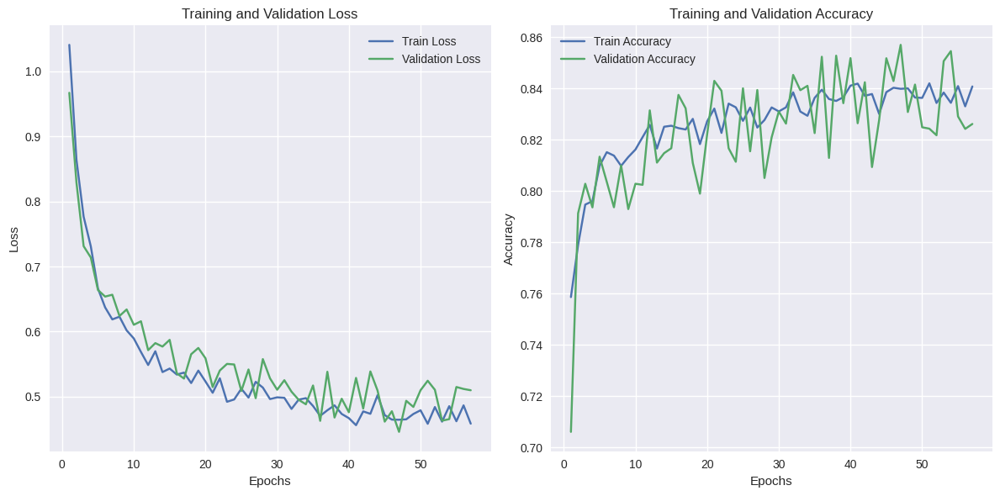

In [45]:
num_epochs = len(train_losses)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(range(1, num_epochs + 1), train_losses, label='Train Loss')
plt.plot(range(1, num_epochs + 1), val_losses, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(range(1, num_epochs + 1), train_accuracies, label='Train Accuracy')
plt.plot(range(1, num_epochs + 1), val_accuracies, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

## Plottings

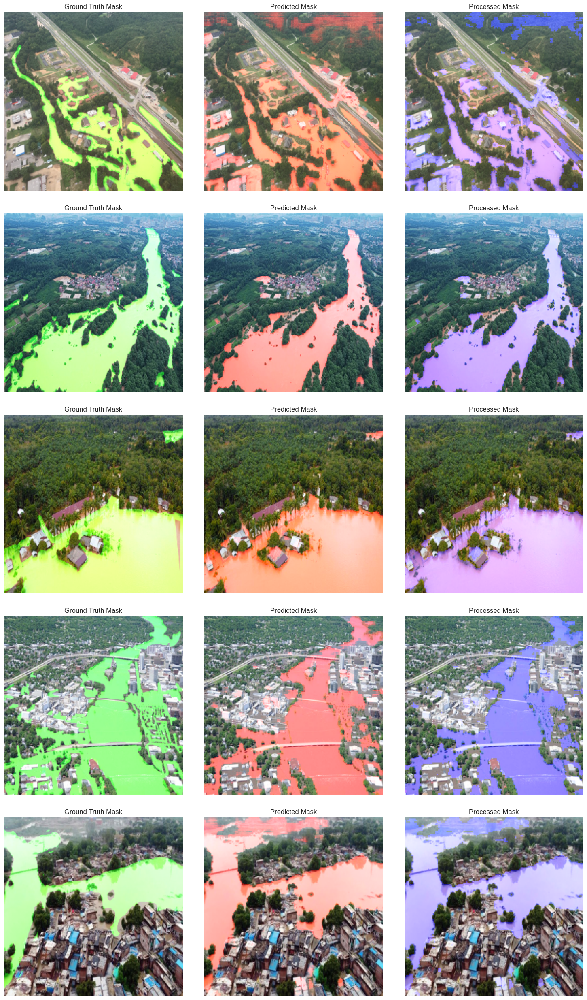

In [54]:
import cv2

def overlay_mask(image, mask, alpha=0.5, color='red'):
    image = (image * 255).astype(np.uint8)  # Convert image to uint8 if it's in [0, 1] range
    mask = cv2.resize(mask, (image.shape[1], image.shape[0]), interpolation=cv2.INTER_NEAREST)
    if len(mask.shape) == 2:
        mask = np.expand_dims(mask, axis=-1)
    mask_rgb = np.zeros_like(image)
    if color == 'red':
        mask_rgb[:, :, 0] = mask.squeeze() * 255
    elif color == 'green':
        mask_rgb[:, :, 1] = mask.squeeze() * 255
    elif color == 'blue':
        mask_rgb[:, :, 2] = mask.squeeze() * 255
    return cv2.addWeighted(image, 1, mask_rgb.astype(np.uint8), alpha, 0)


def plot_masks_on_images(images, masks, model, num_samples=5, threshold=0.5):
    num_to_show = min(num_samples, len(images))
    indices = random.sample(range(len(images)), num_to_show)

    fig, axes = plt.subplots(num_to_show, 3, figsize=(15, 5 * num_to_show))
    fig.tight_layout()

    for i, idx in enumerate(indices):
        image = images[idx]
        mask_gt = masks[idx]

        image_tensor = torch.from_numpy(image).float().permute(2, 0, 1).unsqueeze(0).to(device)
        with torch.no_grad():
            pred_mask_tensor = model(image_tensor).cpu().numpy().squeeze(0).squeeze(0)
            pred_mask = pred_mask_tensor > threshold
            pred_mask = pred_mask.astype(np.float32)

        gt_overlay = overlay_mask(image, mask_gt, alpha=0.5, color='green')
        pred_overlay = overlay_mask(image, pred_mask_tensor, alpha=0.5, color='red')
        pred_overlay_thresholded = overlay_mask(image, pred_mask, alpha=0.5, color='blue')

        # Plot the original image with masks
        axes[i, 0].imshow(gt_overlay)
        axes[i, 0].set_title('Ground Truth Mask')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(pred_overlay)
        axes[i, 1].set_title('Predicted Mask')
        axes[i, 1].axis('off')

        axes[i, 2].imshow(pred_overlay_thresholded)
        axes[i, 2].set_title('Processed Mask')
        axes[i, 2].axis('off')

    plt.show()

plot_masks_on_images(images, masks, model, num_samples=5)

1. **Comparison with Conventional Loss Functions**:
    - How do Dice and Jaccard Losses differ from Cross-Entropy or Mean Squared Error, particularly in terms of sensitivity to class imbalances?
    - What advantages do these losses offer in capturing the spatial overlap between the predicted and true segmentations?

*Dice and Jaccard losses focus on the spatial overlap between predicted and true segmentations, making them inherently sensitive to the degree of intersection, unlike Cross-Entropy or Mean Squared Error, which evaluate pixel-wise differences. These losses are particularly advantageous in handling class imbalances, as they directly measure region-level similarity, ensuring small or underrepresented classes contribute proportionally to the loss.*

2. **Interpretation of Loss Values**:
    - Discuss what high or low loss scores reveal about the state and effectiveness of your segmentation model.

*High loss scores indicate poor alignment between predicted and true segmentations, suggesting the model struggles to learn spatial relationships. Low loss values reflect effective segmentation, where predictions closely match ground truth, implying the model captures the target regions accurately.*

Evaluate the role of the attention mechanism in optimizing segmentation accuracy in cluttered environments. How does it refine the segmentation process?

*The attention mechanism enhances segmentation accuracy in cluttered environments by prioritizing relevant spatial regions and filtering out irrelevant or noisy features. It assigns higher weights to critical features, helping the model focus on target structures while ignoring background distractions. By integrating contextual information from both high-level and low-level feature maps, attention gates refine the segmentation process by improving the localization of boundaries and enhancing the model's ability to discern overlapping or closely-packed objects. This targeted focus significantly optimizes accuracy in challenging, cluttered scenarios.*

What is the importance of skip connections in U-Net, and how do they enhance the accuracy of segmentation tasks?

*Skip connections in U-Net are crucial for preserving spatial details and enhancing segmentation accuracy. They directly transfer feature maps from the encoder to the decoder, allowing the model to combine high-resolution spatial information from earlier layers with contextual features extracted during deeper processing. This fusion helps recover fine-grained details lost during downsampling, improving boundary localization and accuracy, especially for small or complex structures. Skip connections also facilitate better gradient flow during training, mitigating the vanishing gradient problem and accelerating convergence.*

Explain the difference between the predicted and processed mask above.

*The predicted mask refers to the raw output from the segmentation model, typically in the form of probabilities or continuous values between 0 and 1, representing the likelihood of each pixel belonging to a specific class. These values are unprocessed and may include gradual transitions between foreground and background pixels.*

*The processed mask is derived by applying a predefined threshold (often 0.5) to the predicted mask. Values above the threshold are considered part of the object (usually assigned to the foreground), while values below the threshold are considered background. This process converts the continuous prediction into a binary mask, making it suitable for clear-cut segmentation tasks where the goal is to classify each pixel as either part of the object or not.*